In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import tensorflow as tf
print(tf.__version__)

2.16.1


# Importing Libraries

In [3]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import requests

import cv2
from PIL import Image
import imghdr
from io import BytesIO

import tensorflow as tf
import tensorflow_hub as hub

import itertools
import time


from tensorflow import keras
from tensorflow.keras.applications.efficientnet import EfficientNetB7  as PretrainedModel, preprocess_input
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from glob import glob

# CUDA Check and Setup

## Enabling and testing the GPU

In [4]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Set CUDA Device for TensorFlow

In [5]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Use GPU 0

In [6]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import os

In [7]:
# Path to the images folder in Google Drive
image_folder_path = '/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/'

# Loading Images

In [8]:
def load_images(folder, load_fraction=0.5):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, (224, 224))
            images.append(img)
    
    # Calculate the number of images to load
    num_images_to_load = int(len(images) * load_fraction)
    images = images[:num_images_to_load]  # Select only the first half
    
    return np.array(images)

In [9]:
# Load only half the images
benign = load_images(image_folder_path + 'lung_n', load_fraction=0.5)
mal_aca = load_images(image_folder_path + 'lung_aca', load_fraction=0.5)
mal_scc = load_images(image_folder_path + 'lung_scc', load_fraction=0.5)

# Check if any array is empty
if benign.size == 0:
    print("Error: benign image array is empty.")
if mal_aca.size == 0:
    print("Error: mal_aca image array is empty.")
if mal_scc.size == 0:
    print("Error: mal_scc image array is empty.")

# Preprocessing transformations

## Checking number of images in directory

In [10]:
print(f"Number of images for every class: BENIGN {benign.shape[0]}, ADENOCARCINOMAS {mal_aca.shape[0]}, SQUAMOS CELL CARCINOMAS {mal_scc.shape[0]}.")
print(f"Images shape: For BENIGN {benign[0].shape},FOR ADENOCARCINOMAS {mal_aca[0].shape}, FOR SQUAMOS CELL CARCINOMAS {mal_scc[0].shape}")

Number of images for every class: BENIGN 2500, ADENOCARCINOMAS 2500, SQUAMOS CELL CARCINOMAS 2500.
Images shape: For BENIGN (224, 224, 3),FOR ADENOCARCINOMAS (224, 224, 3), FOR SQUAMOS CELL CARCINOMAS (224, 224, 3)


## Concatenating all the images samples

In [11]:
samples = np.concatenate((benign, mal_aca, mal_scc))
labels = np.array(benign.shape[0] * [0] + mal_aca.shape[0] * [1]+ mal_scc.shape[0] * [2] )

In [12]:
print(f"Samples shape check: {samples.shape}.")
print(f"Labels shape check: {labels.shape}.")

Samples shape check: (7500, 224, 224, 3).
Labels shape check: (7500,).


## Random shuffling of samples

In [13]:
indices = np.arange(samples.shape[0])
np.random.shuffle(indices)

samples = samples[indices]
labels = labels[indices]

# normalize pictures
samples = samples.astype('float32') / 255

## Displaying the samples

In [14]:
import matplotlib.pyplot as plt

# Visualize images with labels
def visualize_images_with_labels(images, labels, class_names, title="Images"):
    """
    Visualize a set of images with their corresponding labels.

    Args:
        images (numpy.ndarray): Array of images (H, W, C) or (N, H, W, C).
        labels (list or numpy.ndarray): Corresponding labels for the images.
        class_names (list): List of class names (e.g., ['Benign', 'Malignant']).
        title (str): Title for the visualization.
    """
    plt.figure(figsize=(12, 6))
    num_images = min(5, len(images))  # Display up to 05 images
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for visualization
        plt.title(class_names[labels[i]])
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


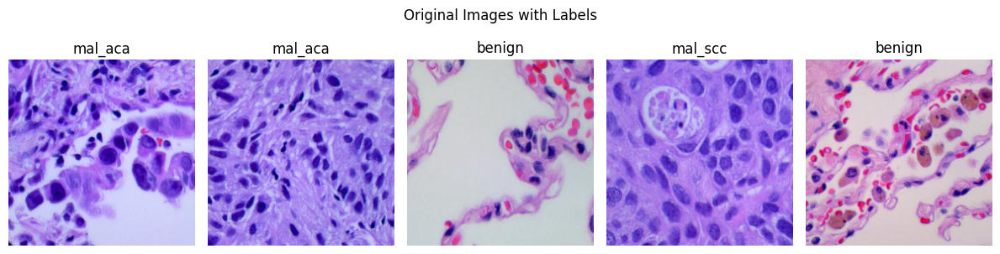

In [15]:
# Define class names
class_names = ['benign', 'mal_aca','mal_scc']

# Visualize before applying RandAugment
visualize_images_with_labels(samples, labels, class_names, title="Original Images with Labels")

# Train-Test Split

In [16]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(samples, labels, test_size=0.2, random_state=42)

print(f"Training samples: {X_train.shape}, Training labels: {y_train.shape}")
print(f"Testing samples: {X_test.shape}, Testing labels: {y_test.shape}")

Training samples: (6000, 224, 224, 3), Training labels: (6000,)
Testing samples: (1500, 224, 224, 3), Testing labels: (1500,)


In [17]:
import collections

# Check class distribution
print("Training label distribution:", collections.Counter(y_train))
print("Testing label distribution:", collections.Counter(y_test))

Training label distribution: Counter({2: 2025, 1: 1994, 0: 1981})
Testing label distribution: Counter({0: 519, 1: 506, 2: 475})


# Performing One-Hot Encoding with TensorFlow/Keras

In [18]:
from tensorflow.keras.utils import to_categorical

num_classes = len(np.unique(y_train))  # Number of classes

# Perform one-hot encoding
y_train_one_hot = to_categorical(y_train, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test, num_classes=num_classes)

print("One-Hot Encoded Training Labels Shape:", y_train_one_hot.shape)
print("One-Hot Encoded Testing Labels Shape:", y_test_one_hot.shape)

One-Hot Encoded Training Labels Shape: (6000, 3)
One-Hot Encoded Testing Labels Shape: (1500, 3)


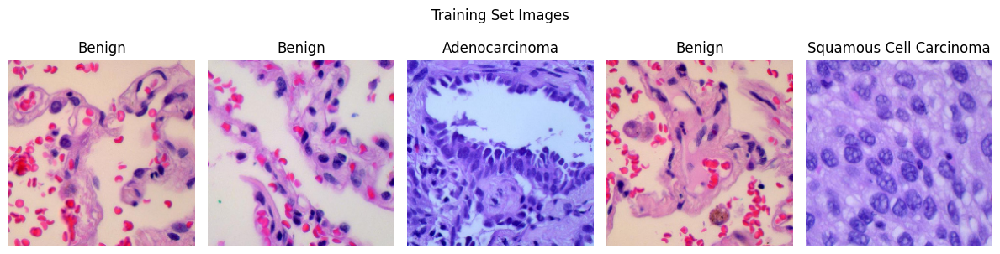

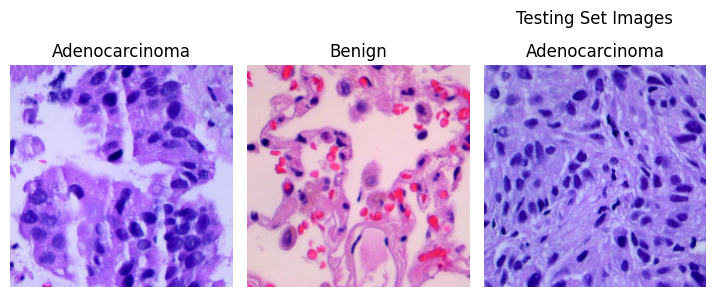

In [19]:
# Define class names
class_names = ["Benign", "Adenocarcinoma","Squamous Cell Carcinoma"]

# Select 3 random images from the training set
train_indices = np.random.choice(len(X_train), 5, replace=False)
train_images = X_train[train_indices]
train_labels = y_train[train_indices]  # Use labels directly

# Visualize training images
visualize_images_with_labels(train_images, train_labels, class_names, title="Training Set Images")

# Select 3 random images from the testing set
test_indices = np.random.choice(len(X_test), 3, replace=False)
test_images = X_test[test_indices]
test_labels = y_test[test_indices]  # Use labels directly

# Visualize testing images
visualize_images_with_labels(test_images, test_labels, class_names, title="Testing Set Images")


# Select half of the training data (Optional)

In [20]:
# # Select half of the training data
# half_index = len(X_train) // 2
# X_train_half = X_train[:half_index]
# y_train_one_hot_half = y_train_one_hot[:half_index]

# Defining CNN base model

In [21]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

def build_custom_cnn(input_shape=(224, 224, 3), num_classes=3):
    inputs = Input(shape=input_shape)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Defining ResNet50

In [22]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

def build_resnet50(input_shape=(224, 224, 3), num_classes=3):
    inputs = Input(shape=input_shape)
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=inputs)

    # Add custom layers on top
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model


# Defining EfficientNetB0

In [23]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam

def build_efficientnet(input_shape=(224, 224, 3), num_classes=3):
    inputs = Input(shape=input_shape)
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_tensor=inputs)

    # Add custom layers on top
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Pre-Trained Models (Optional)

In [24]:
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet50, efficientnet_b0
def get_model(model_name, num_classes=2):
    if model_name == "resnet50":
        model = resnet50(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "efficientnet":
        model = efficientnet_b0(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    else:  # Default to a simple CNN
        model = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(16 * 112 * 112, num_classes)
        )
    return model

# Logging Implementation

In [25]:
import logging

# Configure logging
logging.basicConfig(
    filename='lung_cancer_classification_training_logs.log',  # Log file name
    level=logging.INFO,            # Log level
    format='%(asctime)s - %(levelname)s - %(message)s'
)

# Function to log messages
def log_message(message):
    logging.info(message)
    print(message)  # Optionally print to console as well


# Defining Functions to Save & Load models

In [26]:
# Save the model
def save_model(model, filepath, model_name="Model"):
    model.save(filepath)
    log_message(f"{model_name} saved at {filepath}")

In [27]:
# Load the model
def load_model(filepath, model_name="Model"):
    from tensorflow.keras.models import load_model
    model = load_model(filepath)
    log_message(f"{model_name} loaded from {filepath}")
    return model

# Define Function to Calculate Evaluation Metrics

In [28]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Evaluate model performance
def evaluate_model(model, X_test, y_test, model_name="Model", class_labels=None):
    """
    Evaluate the performance of a multi-class classification model.

    Args:
        model: Trained model to evaluate.
        X_test: Test features (images).
        y_test: True labels (one-hot encoded or categorical integers).
        model_name: Name of the model (for display purposes).
        class_labels: List of class labels for confusion matrix.

    Returns:
        acc, f1, precision, recall: Calculated metrics.
    """
    if class_labels is None:
        class_labels = [str(i) for i in range(y_test.shape[1])]  # Default to "0", "1", "2", etc.

    print(f"Evaluating {model_name}...")

    # Predict probabilities
    y_pred_probs = model.predict(X_test)  # Probabilities for each class
    y_pred = np.argmax(y_pred_probs, axis=1)  # Predicted class indices
    y_true = np.argmax(y_test, axis=1)  # True class indices (from one-hot)

    # Calculate metrics
    acc = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average="weighted")  # Weighted F1 for multi-class
    precision = precision_score(y_true, y_pred, average="weighted")  # Weighted precision
    recall = recall_score(y_true, y_pred, average="weighted")  # Weighted recall

    # Log metrics
    print(f"{model_name} Evaluation Metrics:")
    print(f"Accuracy: {acc * 100:.2f}%")
    print(f"F1-Score: {f1:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f"Confusion Matrix: {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    return acc, f1, precision, recall


# Define Function to Plot Training Curves

In [29]:
def plot_training_curves(history, model_name="Model"):
    plt.figure(figsize=(12, 5))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    if 'val_accuracy' in history.history:
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f"{model_name} Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f"{model_name} Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


# Defining Grad-CAM Implementation

## Checking Layers for Grad Cam

In [30]:
def get_all_layers(model):
    """
    Recursively extract all layers from a model, including nested Sequential layers.
    """
    layers = []
    for layer in model.layers:
        if isinstance(layer, tf.keras.models.Sequential) or isinstance(layer, tf.keras.Model):
            layers.extend(get_all_layers(layer))  # Recursively get layers
        else:
            layers.append(layer)
    return layers


## Grad-CAM Function

In [31]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# def grad_cam(model, img_array, layer_name, class_index):
#     """
#     Generate a Grad-CAM heatmap for the given model, image, and layer.
#     """
#     grad_model = tf.keras.models.Model(
#         inputs=model.input,
#         outputs=[model.get_layer(layer_name).output, model.output]
#     )
#     with tf.GradientTape() as tape:
#         conv_outputs, predictions = grad_model(img_array)
#         loss = predictions[:, class_index]

#     # Compute gradients
#     grads = tape.gradient(loss, conv_outputs)

#     # Compute guided gradients
#     guided_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

#     # Generate heatmap
#     conv_outputs = conv_outputs[0]
#     guided_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
#     heatmap = tf.reduce_mean(tf.multiply(conv_outputs, guided_grads), axis=-1)

#     # Normalize heatmap
#     heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
#     heatmap = heatmap.numpy()
#     return heatmap
def grad_cam(model, img_array, layer_name, class_index):
    """Generate Grad-CAM heatmap."""
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(conv_outputs, guided_grads), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    heatmap = tf.image.resize(heatmap[..., tf.newaxis], (img_array.shape[1], img_array.shape[2]))
    return heatmap.numpy().squeeze()

## Grad-CAM Visualization

In [32]:
from matplotlib import colormaps

# def visualize_grad_cam(image, heatmap, alpha=0.4):
#     """
#     Overlay the Grad-CAM heatmap on the original image.
#     Args:
#         image: Original image tensor scaled between 0 and 1.
#         heatmap: Heatmap tensor, normalized between 0 and 1.
#         alpha: Opacity of the heatmap overlay.
#     """
#     # Rescale heatmap to 0–1
#     heatmap = np.expand_dims(heatmap, axis=-1)  # Add channel dimension
#     heatmap = tf.image.resize(heatmap, (image.shape[0], image.shape[1]))
#     heatmap = tf.cast(heatmap, dtype=tf.float32)

#     # Overlay heatmap on the original image
#     jet = colormaps.get_cmap("jet")  # Use updated Matplotlib API
#     jet_colors = jet(np.arange(256))[:, :3]  # Extract RGB colors
#     jet_heatmap = jet_colors[np.uint8(heatmap.numpy() * 255)]  # Map heatmap to jet colors

#     superimposed_img = image + alpha * jet_heatmap
#     superimposed_img = tf.clip_by_value(superimposed_img, 0, 1)  # Clip values to [0, 1]

#     plt.imshow(superimposed_img)
#     plt.axis("off")
#     plt.show()
def visualize_grad_cam(image, heatmap, alpha=0.4):
    """Overlay the Grad-CAM heatmap on the original image."""
    jet = plt.cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    heatmap = np.uint8(255 * heatmap)
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = tf.image.resize(jet_heatmap, (image.shape[0], image.shape[1]))
    superimposed_img = tf.clip_by_value(image + alpha * jet_heatmap, 0, 1)
    plt.imshow(superimposed_img.numpy())
    plt.axis("off")
    plt.show()

## Defining Grad-CAM on all layer

In [33]:
def apply_grad_cam_all_layers(model, test_image, preprocessed_image, label_index):
    """
    Apply Grad-CAM on all convolutional layers of the given model and visualize.
    """
    # Iterate through all layers of the model
    for layer in model.layers:
        layer_name = layer.name
        try:
            # Generate Grad-CAM heatmap for each layer
            heatmap = grad_cam(model, preprocessed_image, layer_name, label_index)
            print(f"Grad-CAM generated for layer: {layer_name}")

            # Visualize the heatmap for the current layer
            visualize_grad_cam(test_image, heatmap, title=f"Grad-CAM for {layer_name}")
        except Exception as e:
            print(f"Skipping layer {layer_name}: {e}")

# Apply Grad-CAM to all layers for a test image
test_image = X_test[0]  # Example test image
test_image_preprocessed = preprocess_input(test_image[np.newaxis, ...])
label_index = np.argmax(y_test[0])  # Get the predicted class

# Defining Function to Train Pipeline for All Models

In [34]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import time

In [35]:
def training_evaluation_pipeline(
    model, X_train, y_train, X_test, y_test, batch_size=32, epochs=20, model_name="Model", save_path="model.h5", class_labels=None
):
    """
    Train, log, and save the model with confusion matrix and Grad-CAM applied for multi-class classification.
    Args:
        model: Keras model to be trained.
        X_train: Training data.
        y_train: Training labels (one-hot encoded or integer class labels).
        X_test: Test data.
        y_test: Test labels (one-hot encoded or integer class labels).
        batch_size: Batch size for training.
        epochs: Number of training epochs.
        model_name: Name of the model (used in logs).
        save_path: Path to save the trained model.
        class_labels: List of class labels for logging and confusion matrix visualization.
    Returns:
        history: Training history object.
    """
    import time
    import numpy as np
    import tensorflow as tf
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
    import seaborn as sns

    if class_labels is None:
        class_labels = [str(i) for i in range(len(np.unique(y_test)))]

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # Log model summary
    model.summary()

    # Start training
    print(f"Starting training for {model_name}...")
    start_time = time.time()
    history = model.fit(
        X_train, y_train,
        validation_data=(X_test, y_test),
        epochs=epochs,
        batch_size=batch_size
    )
    end_time = time.time()
    print(f"Training for {model_name} completed in {(end_time - start_time) / 60:.2f} minutes.")

    # Evaluate the model
    print(f"Evaluating {model_name} on test data...")
    y_pred_probs = model.predict(X_test)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = np.argmax(y_test, axis=1)  # Assumes y_test is one-hot encoded

    # Compute evaluation metrics
    test_acc = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    # Log evaluation metrics
    print(f"{model_name} Evaluation Metrics:")
    print(f"Accuracy: {test_acc * 100:.2f}%")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1-Score: {f1:.2f}")

    # Confusion Matrix Visualization
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # Save the trained model
    model.save(save_path)
    print(f"{model_name} saved at {save_path}.")

    # Plot training curves
    plot_training_curves(history, model_name)

    # Grad-CAM Application
    print(f"Applying Grad-CAM on 3 random test images for {model_name}...")
    indices = np.random.choice(len(X_test), 3, replace=False)

    for idx in indices:
        test_image = X_test[idx]
        test_label = y_true[idx]

        # Preprocess the test image for Grad-CAM
        test_image_preprocessed = test_image[np.newaxis, ...]

        # Use a specific convolutional layer for Grad-CAM
        last_conv_layer_name = [layer.name for layer in model.layers if 'conv' in layer.name][-1]

        try:
            # Compute Grad-CAM heatmap
            heatmap = grad_cam(model, test_image_preprocessed, last_conv_layer_name, test_label)
            visualize_grad_cam(test_image, heatmap)
            plt.title(f"Grad-CAM for Layer: {last_conv_layer_name} (True Label: {class_labels[test_label]})")
            plt.show()
        except Exception as e:
            print(f"Skipping Grad-CAM for layer {last_conv_layer_name} due to: {e}")

    return history, test_acc, precision, recall, f1


# Training Models before RandAugment

## CNN before RandAugment

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,785,283 (98.36 MB)

 Trainable params: 25,784,835 (98.36 MB)

 Non-trainable params: 448 (1.75 KB)

Starting training for Custom CNN...
Epoch 1/15


I0000 00:00:1733967729.511245      70 service.cc:145] XLA service 0x7fc59c003bc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733967729.511316      70 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 13/750 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - accuracy: 0.6391 - loss: 24.3297

I0000 00:00:1733967737.271026      70 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_1', 52 bytes spill stores, 52 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 36 bytes spill stores, 36 bytes spill loads

I0000 00:00:1733967737.283142      70 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


750/750 ━━━━━━━━━━━━━━━━━━━━ 25s 19ms/step - accuracy: 0.7415 - loss: 17.2881 - val_accuracy: 0.4500 - val_loss: 27.8760
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7750 - loss: 1.0196 - val_accuracy: 0.7093 - val_loss: 1.1612
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.8312 - loss: 0.4859 - val_accuracy: 0.7900 - val_loss: 0.4947
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7691 - loss: 0.9242 - val_accuracy: 0.8700 - val_loss: 0.4691
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7877 - loss: 0.5835 - val_accuracy: 0.7633 - val_loss: 1.1279
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7611 - loss: 0.6773 - val_accuracy: 0.9073 - val_loss: 0.3328
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7930 - loss: 0.5048 - val_accuracy: 0.8140 - val_loss: 0.4271
Epoch 8/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.7945 - loss: 0.5252 - val_accur

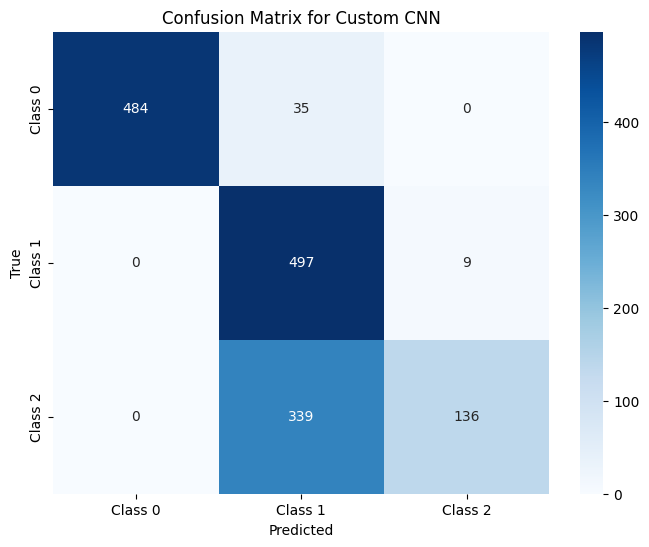

Custom CNN saved at custom_cnn.h5.


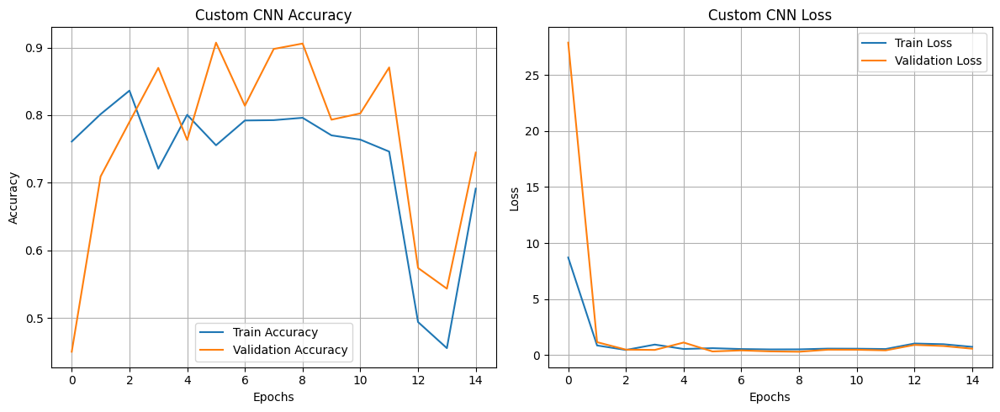

Applying Grad-CAM on 3 random test images for Custom CNN...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")
/tmp/ipykernel_23/2278269453.py:31: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


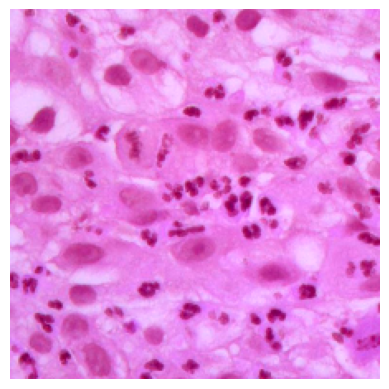

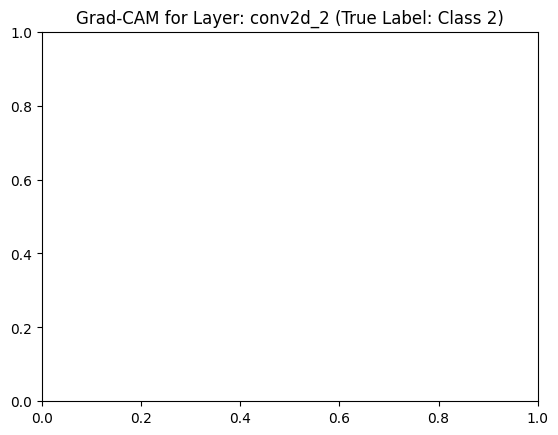

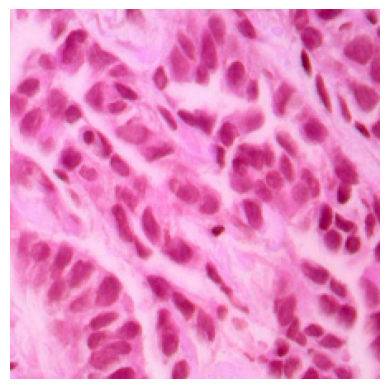

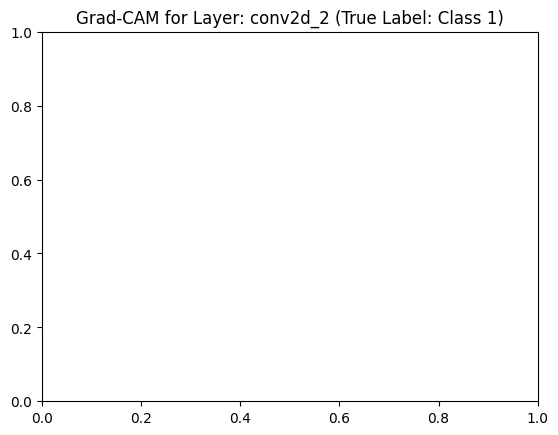

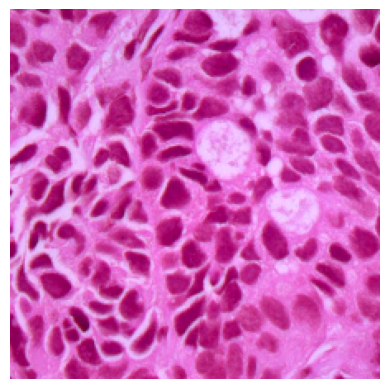

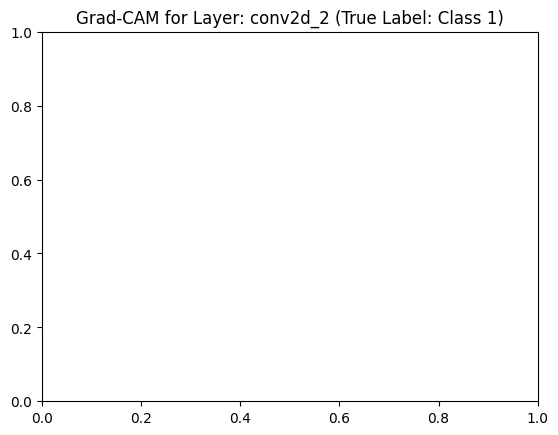

Custom CNN Build for Lung Cancer Classification's Training Complete with Half Training Data on GPU.


In [36]:
import numpy as np
import tensorflow as tf

# Select half of the training data
# half_index = len(X_train) // 2
# X_train_half = X_train[:half_index]
# y_train_one_hot_half = y_train_one_hot[:half_index]

# Ensure GPU is used for training
with tf.device('/GPU:0'):  # Specify to run on GPU
    # Build the Custom CNN
    custom_cnn = build_custom_cnn(input_shape=(224, 224, 3), num_classes=3)

    # Train and evaluate the Custom CNN using half the training data
    history_cnn, acc_cnn, precision_cnn, recall_cnn, f1_cnn = training_evaluation_pipeline(
        custom_cnn,
        X_train, y_train_one_hot, 
        X_test, y_test_one_hot,
        batch_size=8,
        epochs=15,
        model_name="Custom CNN",
        save_path="custom_cnn.h5",
        class_labels=["Class 0", "Class 1", "Class 2"]
    )

# Log results
log_message("Custom CNN Build for Lung Cancer Classification's Training Complete with Half Training Data on GPU.")

## ResNet50 before RandAugment

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,113,027 (91.98 MB)

 Trainable params: 24,059,907 (91.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

Starting training for ResNet50...
Epoch 1/15
  1/750 ━━━━━━━━━━━━━━━━━━━━ 10:06:42 49s/step - accuracy: 0.3750 - loss: 1.3375

I0000 00:00:1733967977.321340      70 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_add_reduce_fusion_31', 456 bytes spill stores, 456 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_23', 16 bytes spill stores, 16 bytes spill loads



750/750 ━━━━━━━━━━━━━━━━━━━━ 107s 77ms/step - accuracy: 0.8003 - loss: 0.7021 - val_accuracy: 0.3167 - val_loss: 3.3224
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.9025 - loss: 0.2831 - val_accuracy: 0.8827 - val_loss: 0.2623
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.9238 - loss: 0.1948 - val_accuracy: 0.9287 - val_loss: 0.2185
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.9356 - loss: 0.1781 - val_accuracy: 0.8433 - val_loss: 0.4203
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.9280 - loss: 0.1833 - val_accuracy: 0.9593 - val_loss: 0.1061
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.9509 - loss: 0.1237 - val_accuracy: 0.9407 - val_loss: 0.1437
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.9523 - loss: 0.1277 - val_accuracy: 0.9413 - val_loss: 0.1643
Epoch 8/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - accuracy: 0.9523 - loss: 0.1241 - val_accura

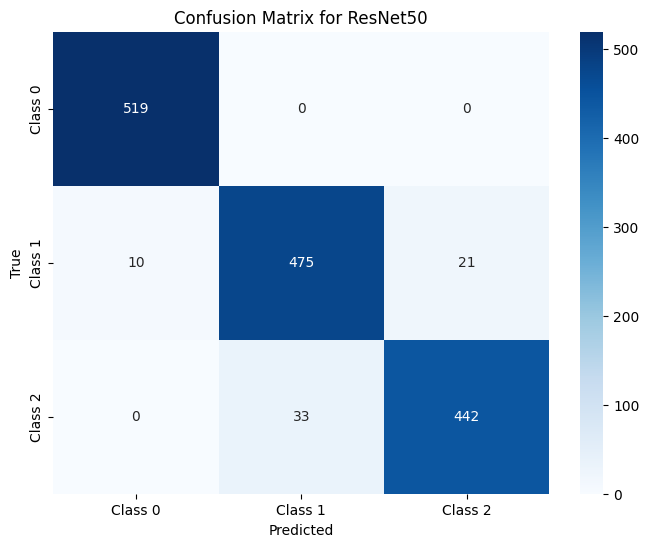

ResNet50 saved at resnet50.h5.


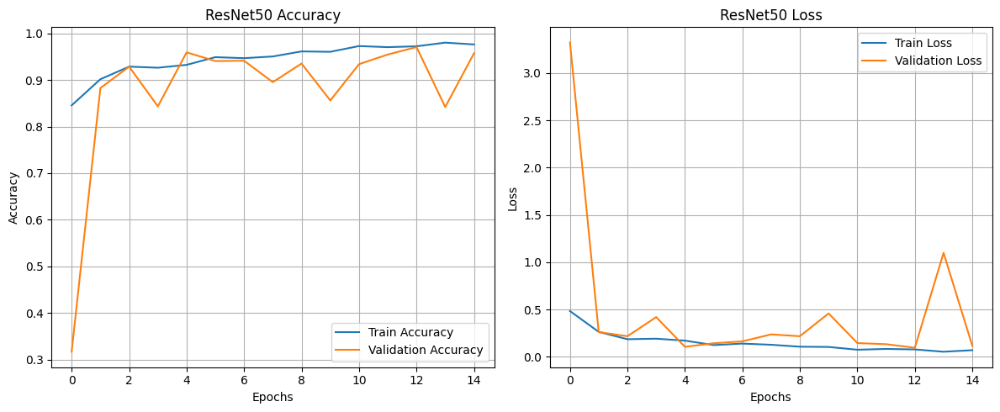

Applying Grad-CAM on 3 random test images for ResNet50...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")


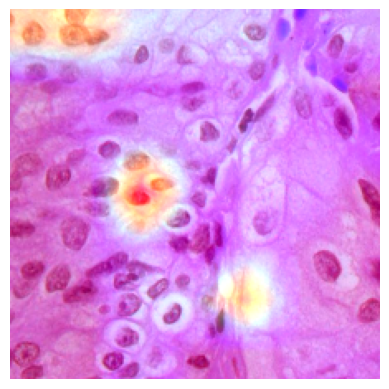

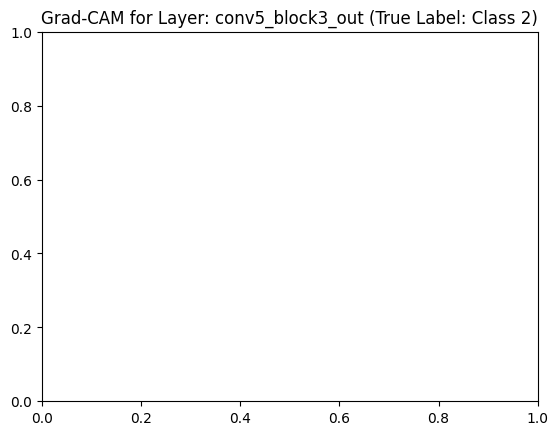

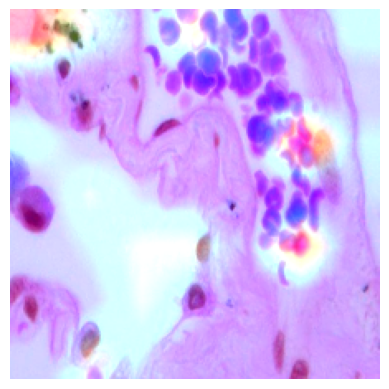

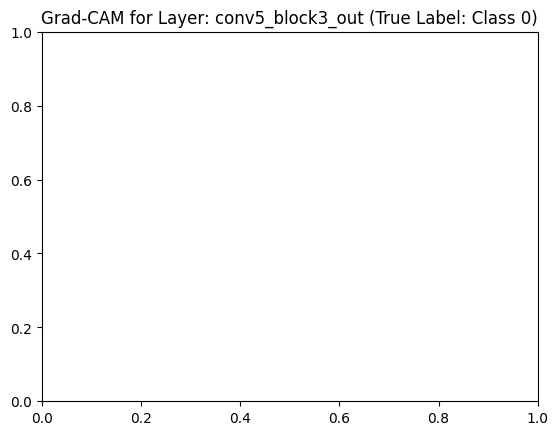

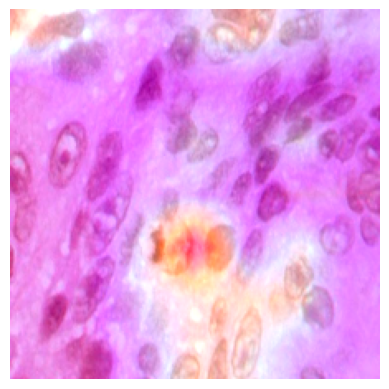

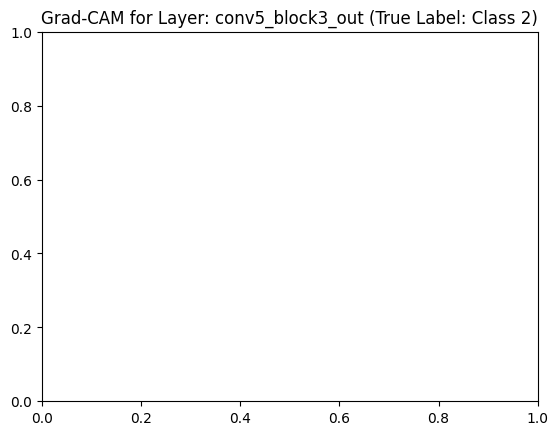

ResNet50 Model for Lung Cancer Classification's Training Complete with Half Training Data on GPU.


In [37]:
# import tensorflow as tf

# # # Select half of the training data
# # half_index = len(X_train) // 2
# # X_train_half = X_train[:half_index]
# # y_train_one_hot_half = y_train_one_hot[:half_index]

# Ensure GPU is used for training
with tf.device('/GPU:0'):  # Specify to run on GPU
    # Build ResNet50
    resnet50_model = build_resnet50(input_shape=(224, 224, 3), num_classes=3)

    # Train and evaluate the ResNet50 using half the training data
    history_resnet50, acc_resnet50, precision_resnet50, recall_resnet50, f1_resnet50 = training_evaluation_pipeline(
        resnet50_model,
        X_train, y_train_one_hot,  # Use half the training data
        X_test, y_test_one_hot,
        batch_size=8,  # Reduced batch size
        epochs=15,
        model_name="ResNet50",
        save_path="resnet50.h5",
        class_labels=["Class 0", "Class 1", "Class 2"]
    )

# Log results
log_message("ResNet50 Model for Lung Cancer Classification's Training Complete with Half Training Data on GPU.")


## EfficientNet50 before RandAugment

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,378,278 (16.70 MB)

 Trainable params: 4,336,255 (16.54 MB)

 Non-trainable params: 42,023 (164.16 KB)

Starting training for EfficientNetB0...
Epoch 1/15
  1/750 ━━━━━━━━━━━━━━━━━━━━ 14:14:02 68s/step - accuracy: 0.3750 - loss: 1.1592

I0000 00:00:1733968851.252863      67 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_3', 36 bytes spill stores, 36 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_4', 36 bytes spill stores, 36 bytes spill loads



750/750 ━━━━━━━━━━━━━━━━━━━━ 111s 57ms/step - accuracy: 0.8565 - loss: 0.4187 - val_accuracy: 0.3347 - val_loss: 3.3844
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9242 - loss: 0.2117 - val_accuracy: 0.9513 - val_loss: 0.1389
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - accuracy: 0.9602 - loss: 0.1112 - val_accuracy: 0.9180 - val_loss: 0.2807
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step - accuracy: 0.9601 - loss: 0.1160 - val_accuracy: 0.9900 - val_loss: 0.0293
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9810 - loss: 0.0615 - val_accuracy: 0.7827 - val_loss: 0.8712
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9633 - loss: 0.1181 - val_accuracy: 0.8653 - val_loss: 0.4458
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9765 - loss: 0.0721 - val_accuracy: 0.9753 - val_loss: 0.0976
Epoch 8/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9845 - loss: 0.0485 - val_accura

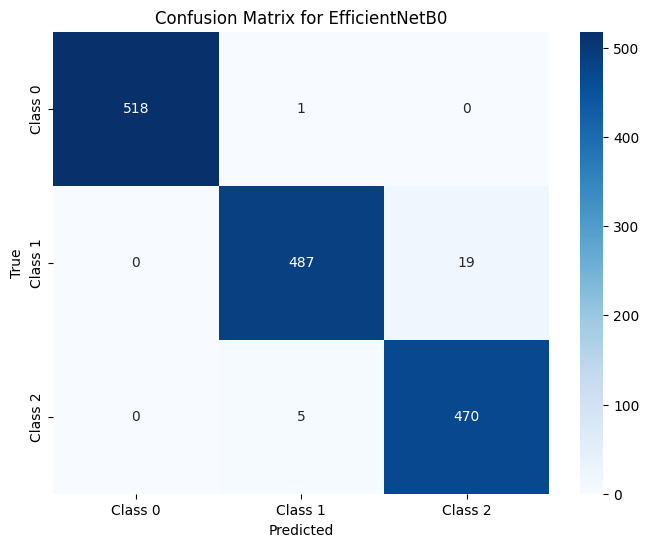

EfficientNetB0 saved at efficientnetb0.h5.


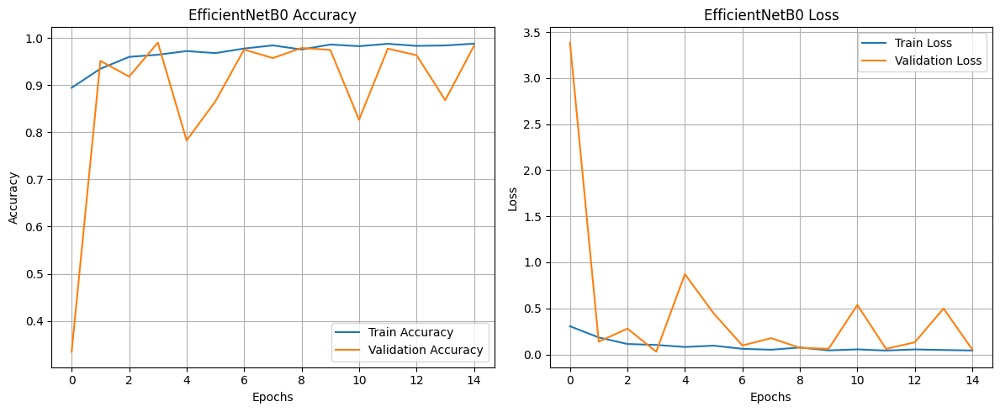

Applying Grad-CAM on 3 random test images for EfficientNetB0...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")


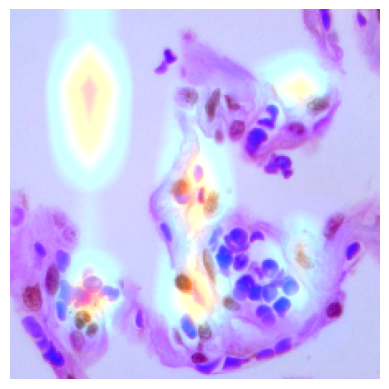

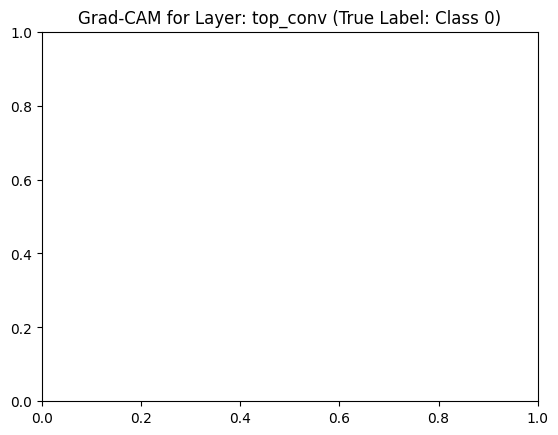

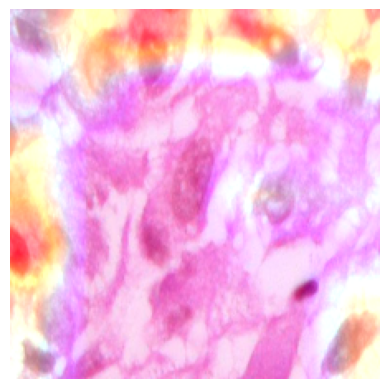

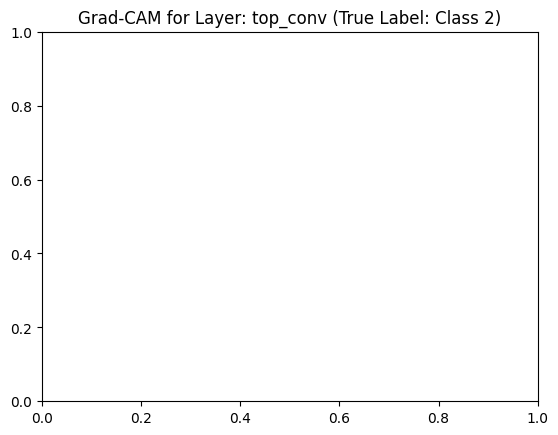

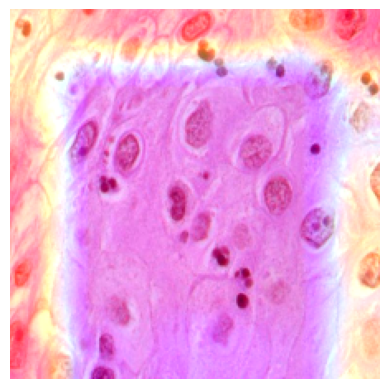

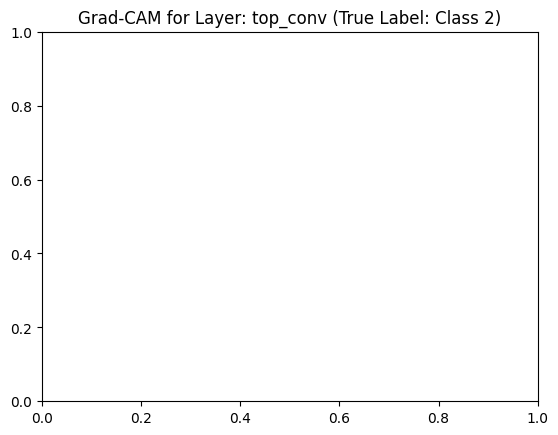

EfficientNetB0 for Lung Cancer Classification's Training Complete with Half Training Data on GPU.


In [38]:
# import tensorflow as tf

# # Ensure GPU is used for training
with tf.device('/GPU:0'):  # Specify to run on GPU
    # Build EfficientNetB0
    efficientnetb0_model = build_efficientnet(input_shape=(224, 224, 3), num_classes=3)

    # Train and evaluate the EfficientNetB0 using half the training data
    history_efficientnetb0, acc_efficientnetb0, precision_efficientnetb0, recall_efficientnetb0, f1_efficientnetb0 = training_evaluation_pipeline(
    efficientnetb0_model,
    X_train, y_train_one_hot,
    X_test, y_test_one_hot,
    batch_size=8,
    epochs=15,
    model_name="EfficientNetB0",
    save_path="efficientnetb0.h5",
    class_labels=["Class 0", "Class 1", "Class 2"]
)

# Log results
log_message("EfficientNetB0 for Lung Cancer Classification's Training Complete with Half Training Data on GPU.")


# Summary of Models before RandAugment

In [39]:
print("Model Performance Comparison:")
print(f"Custom CNN - Accuracy: {acc_cnn:.2f}, Precision: {precision_cnn:.2f}, Recall: {recall_cnn:.2f}, F1 Score: {f1_cnn:.2f}")
print(f"ResNet50   - Accuracy: {acc_resnet50:.2f}, Precision: {precision_resnet50:.2f}, Recall: {recall_resnet50:.2f}, F1 Score: {f1_resnet50:.2f}")
print(f"EffNetB0   - Accuracy: {acc_efficientnetb0:.2f}, Precision: {precision_efficientnetb0:.2f}, Recall: {recall_efficientnetb0:.2f}, F1 Score: {f1_efficientnetb0:.2f}")

Model Performance Comparison:
Custom CNN - Accuracy: 0.74, Precision: 0.84, Recall: 0.74, F1 Score: 0.72
ResNet50   - Accuracy: 0.96, Precision: 0.96, Recall: 0.96, F1 Score: 0.96
EffNetB0   - Accuracy: 0.98, Precision: 0.98, Recall: 0.98, F1 Score: 0.98


In [40]:
# Compile metrics into a dictionary
results = {
    "Model": ["Custom CNN", "ResNet50", "EfficientNetB0"],
    "Accuracy (%)": [acc_cnn * 100, acc_resnet50 * 100, acc_efficientnetb0 * 100],
    "Precision": [precision_cnn, precision_resnet50, precision_efficientnetb0],
    "Recall": [recall_cnn, recall_resnet50, recall_efficientnetb0],
    "F1-Score": [f1_cnn, f1_resnet50, f1_efficientnetb0]
}

# Create DataFrame
results_df = pd.DataFrame(results)

# Save results to CSV
results_df.to_csv("Before_model_results.csv", index=False)

# Log results to a file
log_message("Model Training Results:\n" + results_df.to_string(index=False))

# Display the DataFrame
print("Before RandAugment Model Training Results:")
print(results_df)

Model Training Results:
         Model  Accuracy (%)  Precision   Recall  F1-Score
    Custom CNN     74.466667   0.835497 0.744667  0.716358
      ResNet50     95.733333   0.957183 0.957333  0.957177
EfficientNetB0     98.333333   0.983591 0.983333  0.983341
Before RandAugment Model Training Results:
            Model  Accuracy (%)  Precision    Recall  F1-Score
0      Custom CNN     74.466667   0.835497  0.744667  0.716358
1        ResNet50     95.733333   0.957183  0.957333  0.957177
2  EfficientNetB0     98.333333   0.983591  0.983333  0.983341


# RandAugment Implementation

## Augmentation Function

In [41]:
def rand_augment_transform(image, num_layers=2, magnitude=9, target_size=(224, 224)):
    """Applies RandAugment transformations to an image and resizes it back to the target size."""

    available_ops = [
        lambda img, mag: tf.image.adjust_contrast(img, contrast_factor=1 + mag / 10),  # Contrast
        lambda img, mag: tf.image.adjust_brightness(img, delta=mag / 10),  # Brightness
        lambda img, mag: tf.image.adjust_saturation(img, saturation_factor=1 + mag / 10),  # Saturation
        lambda img, mag: tf.image.adjust_hue(img, delta=mag / 360),  # Hue
        lambda img, mag: tf.image.flip_left_right(img),  # Horizontal flip
        lambda img, mag: tf.image.flip_up_down(img),  # Vertical flip
        lambda img, mag: tf.image.rot90(img, k=random.randint(1, 3)),  # Random 90-degree rotations
        lambda img, mag: tf.image.central_crop(img, central_fraction=1 - mag / 100),  # Central crop
    ]

    transforms_to_apply = random.choices(available_ops, k=num_layers)

    for op in transforms_to_apply:
        mag = random.uniform(0, magnitude)
        image = op(image, mag)

    # Ensure the image is resized back to the target size
    image = tf.image.resize(image, target_size)

    return tf.clip_by_value(image, 0.0, 1.0)  # Ensure pixel values remain valid


Checking if X_train is normalized...
Shape: (6000, 224, 224, 3)
Min value: 0.0
Max value: 1.0
Mean: 0.6838
Standard Deviation: 0.2091


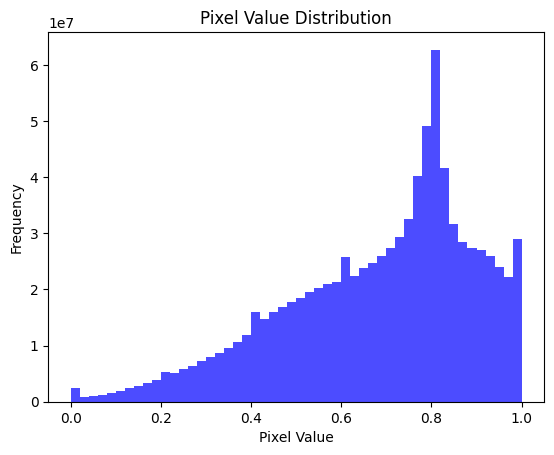

In [42]:
print("Checking if X_train is normalized...")
print(f"Shape: {X_train.shape}")
print(f"Min value: {X_train.min()}")
print(f"Max value: {X_train.max()}")
print(f"Mean: {X_train.mean():.4f}")
print(f"Standard Deviation: {X_train.std():.4f}")

# Plot pixel value distribution
import matplotlib.pyplot as plt

plt.hist(X_train.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Pixel Value Distribution")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()


## Implementing RandAugment on training set

In [43]:
# augmented_images = []
# for image in X_train:
#   augmented_image = rand_augment_transform(image)
#   augmented_images.append(augmented_image)

# X_train_augmented = np.array(augmented_images) # Convert back to NumPy array

In [44]:
def apply_randaugment_to_dataset(X_train, num_layers=2, magnitude=9, target_size=(224, 224)):
    """Applies RandAugment to all images in the dataset."""
    augmented_images = []
    for image in X_train:
        augmented_image = rand_augment_transform(image, num_layers, magnitude, target_size)
        augmented_images.append(augmented_image)
    return tf.stack(augmented_images)


In [45]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import random

# Ensure GPU is used
with tf.device('/GPU:0'):
    # Assuming X_train is normalized and has shape (num_samples, 224, 224, 3)
    X_train_tensor = tf.convert_to_tensor(X_train, dtype=tf.float32)
    X_train_augmented = apply_randaugment_to_dataset(X_train_tensor)

# Convert tensors back to numpy for visualization
X_train_augmented = X_train_augmented.numpy()

In [46]:
# Sample three images for visualization
indices = np.random.choice(len(X_train), size=3, replace=False)
original_images = X_train[indices]
augmented_images = X_train_augmented[indices]
labels = y_train_one_hot[indices]  # Assuming `y_train` is available

## Visualizing Augmented images

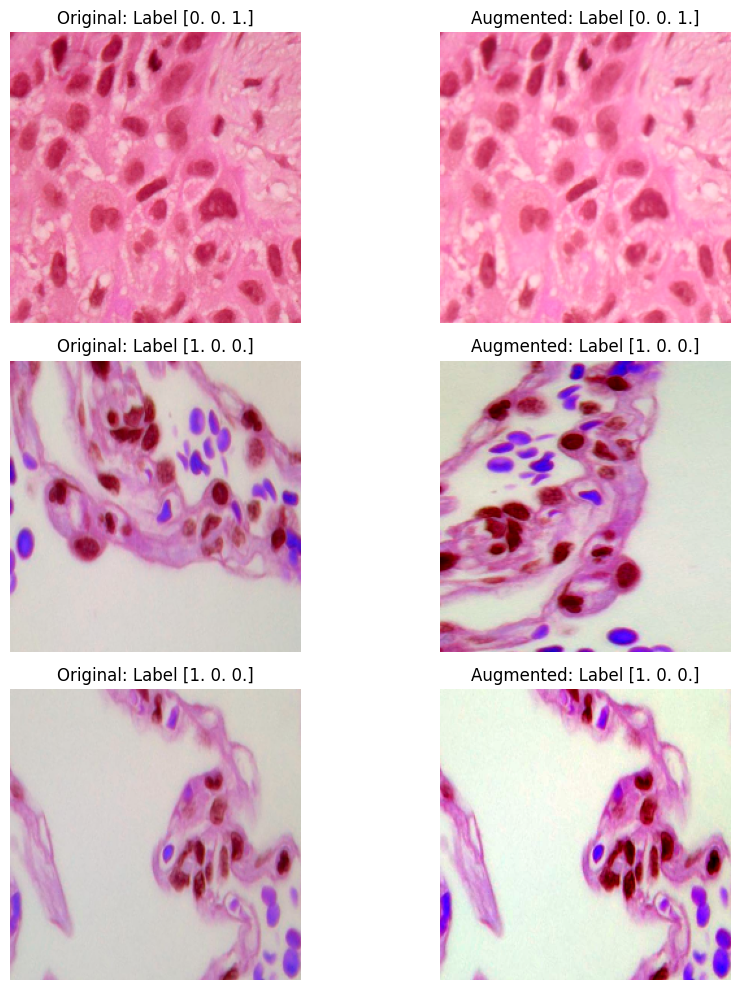

In [47]:
# Visualize original and augmented images
fig, axes = plt.subplots(3, 2, figsize=(10, 10))

for i in range(3):
    # Original image
    axes[i, 0].imshow(original_images[i])
    axes[i, 0].set_title(f"Original: Label {labels[i]}")
    axes[i, 0].axis("off")
    
    # Augmented image
    axes[i, 1].imshow(augmented_images[i])
    axes[i, 1].set_title(f"Augmented: Label {labels[i]}")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()

# Training Models after RandAugment

## CNN after RandAugment

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,785,283 (98.36 MB)

 Trainable params: 25,784,835 (98.36 MB)

 Non-trainable params: 448 (1.75 KB)

Starting training for Custom CNN with RandAugment...
Epoch 1/15
 13/750 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - accuracy: 0.4930 - loss: 27.6911

I0000 00:00:1733969463.059424      70 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_1', 52 bytes spill stores, 52 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 36 bytes spill stores, 36 bytes spill loads



750/750 ━━━━━━━━━━━━━━━━━━━━ 22s 19ms/step - accuracy: 0.6072 - loss: 23.2077 - val_accuracy: 0.4560 - val_loss: 0.9278
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.6049 - loss: 0.7932 - val_accuracy: 0.6587 - val_loss: 1.1583
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.6416 - loss: 0.7459 - val_accuracy: 0.6547 - val_loss: 1.4430
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.6312 - loss: 0.8581 - val_accuracy: 0.5340 - val_loss: 0.8781
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.5802 - loss: 0.9634 - val_accuracy: 0.6613 - val_loss: 0.6488
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.5482 - loss: 0.8423 - val_accuracy: 0.3867 - val_loss: 8.7539
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.4803 - loss: 0.9585 - val_accuracy: 0.6027 - val_loss: 0.6875
Epoch 8/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 11s 15ms/step - accuracy: 0.5191 - loss: 0.8920 - val_accura

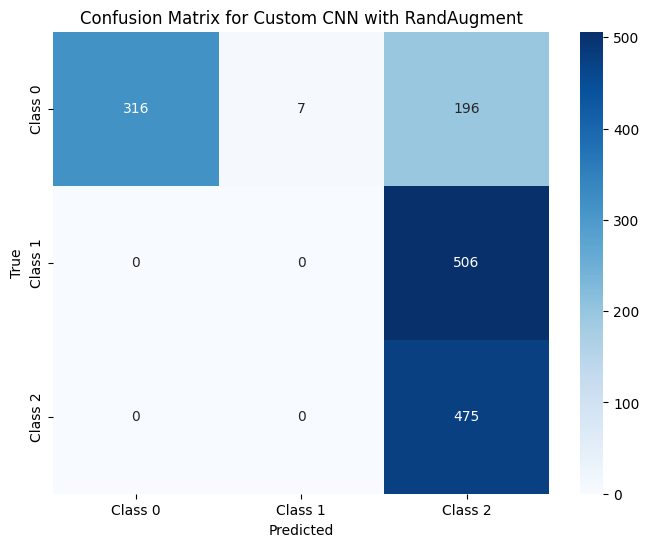

Custom CNN with RandAugment saved at custom_cnn_randaugment.h5.


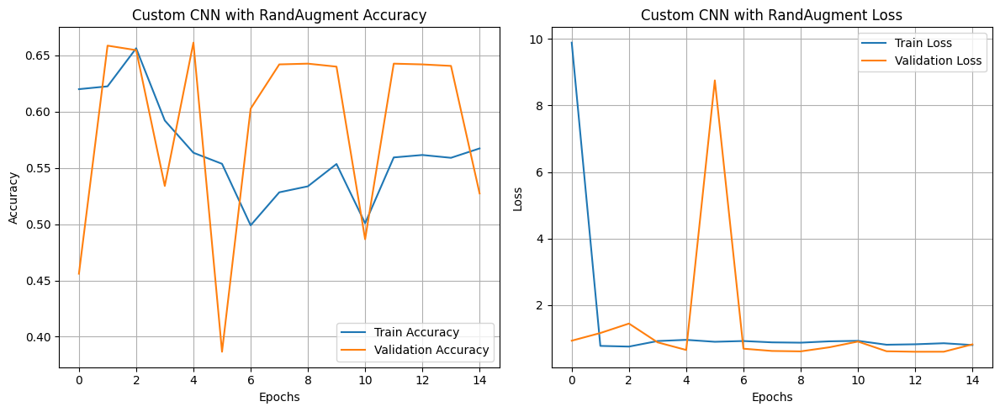

Applying Grad-CAM on 3 random test images for Custom CNN with RandAugment...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")
/tmp/ipykernel_23/2278269453.py:31: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


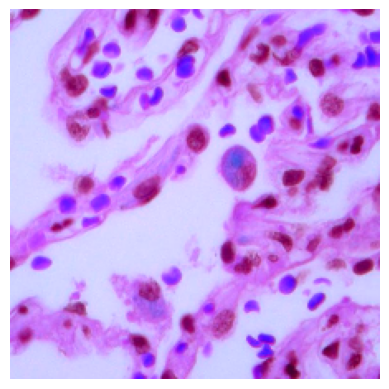

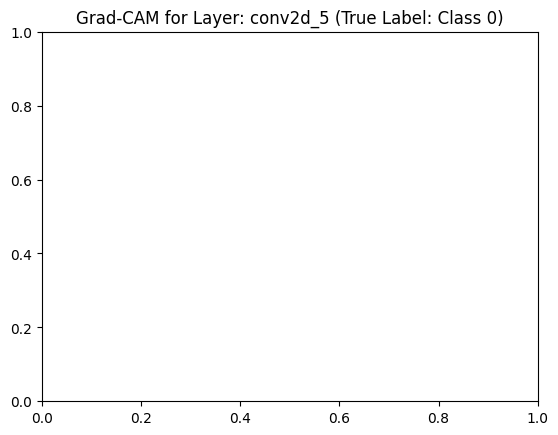

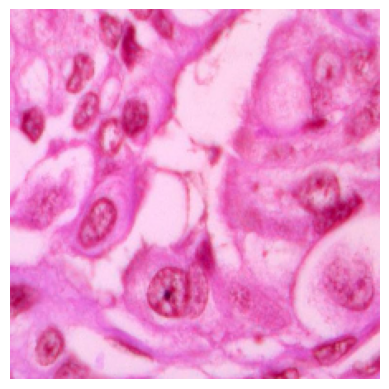

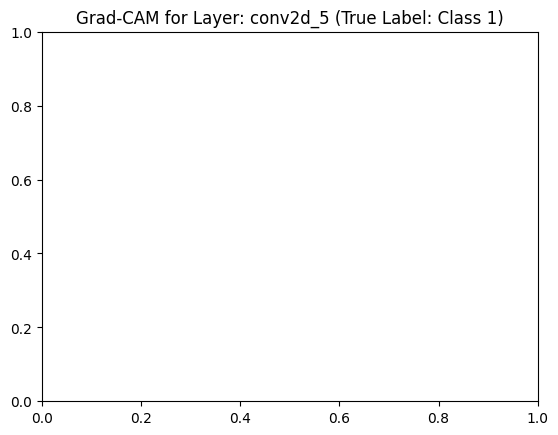

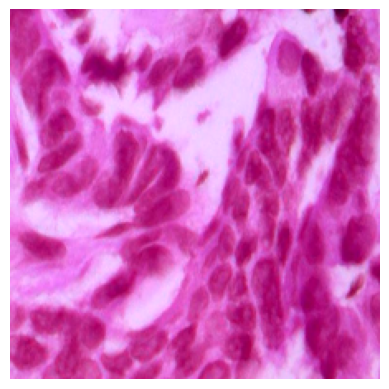

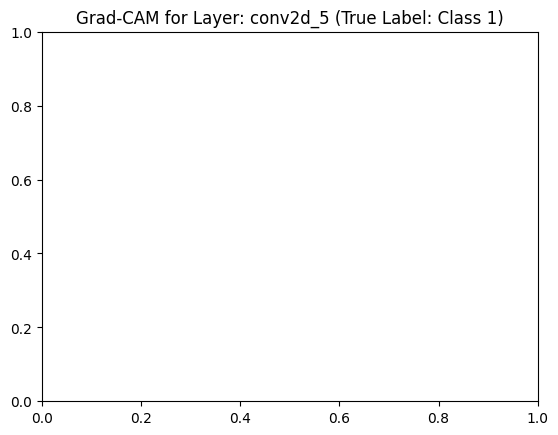

Custom CNN with RandAugment for Lung Cancer Classification's Training Complete using half Training Data on GPU.


In [48]:
import tensorflow as tf

# Train Custom CNN
with tf.device('/GPU:0'):  # Ensure GPU is used for training
    custom_cnn_randaugment = build_custom_cnn()

    # Train and evaluate the Custom CNN with RandAugment using the full dataset
    history_cnn_randaugment, acc_cnn_randaugment, precision_cnn_randaugment, recall_cnn_randaugment, f1_cnn_randaugment = training_evaluation_pipeline(
        custom_cnn_randaugment,
        X_train_augmented, y_train_one_hot,  # Use the full preprocessed training dataset
        X_test, y_test_one_hot,              # Use the full preprocessed testing dataset
        batch_size=8,
        epochs=15,
        model_name="Custom CNN with RandAugment",
        save_path="custom_cnn_randaugment.h5",
        class_labels=["Class 0", "Class 1", "Class 2"]
    )

# Log results
log_message("Custom CNN with RandAugment for Lung Cancer Classification's Training Complete using half Training Data on GPU.")


## ResNet50 after RandAugment

Model: "functional_33"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,113,027 (91.98 MB)

 Trainable params: 24,059,907 (91.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

Starting training for ResNet50 with RandAugment...
Epoch 1/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 100s 76ms/step - accuracy: 0.6338 - loss: 0.9635 - val_accuracy: 0.3167 - val_loss: 2.4351
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.8254 - loss: 0.4214 - val_accuracy: 0.9253 - val_loss: 0.2091
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - accuracy: 0.8537 - loss: 0.3696 - val_accuracy: 0.7907 - val_loss: 0.4582
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.8591 - loss: 0.3314 - val_accuracy: 0.8287 - val_loss: 0.3540
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.8690 - loss: 0.2863 - val_accuracy: 0.9140 - val_loss: 0.2209
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.8839 - loss: 0.2848 - val_accuracy: 0.8187 - val_loss: 0.4520
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - accuracy: 0.8873 - loss: 0.2756 - val_accuracy: 0.9140 - val_loss: 0.2184
Epoch 8/15
750/750 ━━━━━━━━━━━━━━━━━━━

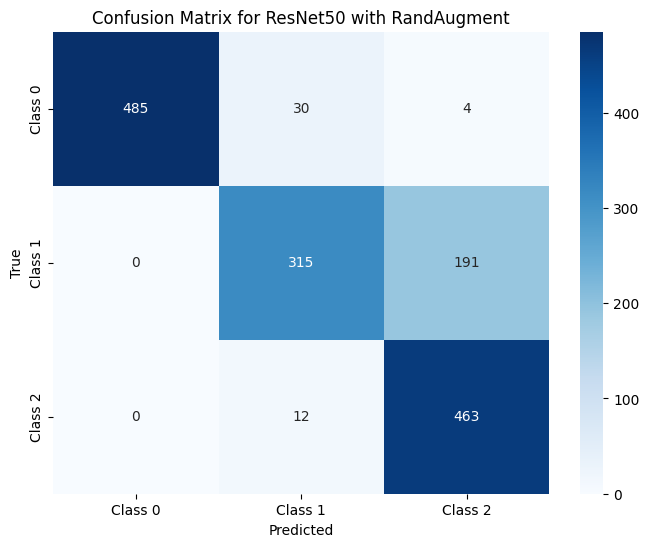

ResNet50 with RandAugment saved at resnet50_randaugment.h5.


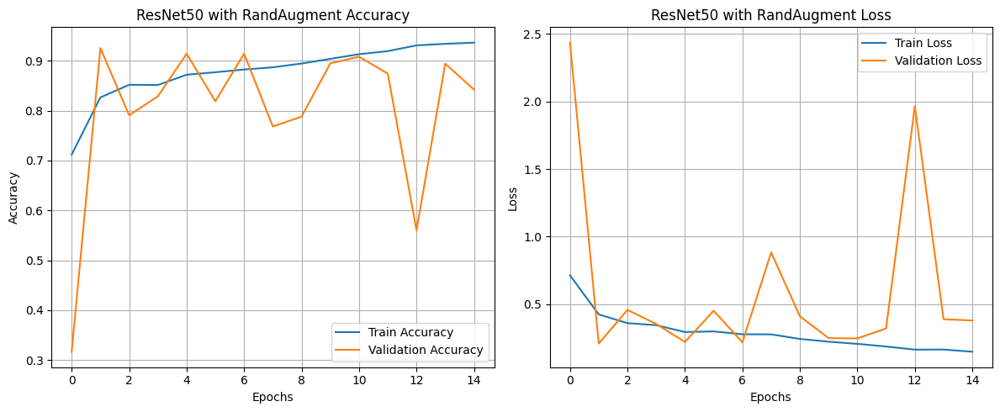

Applying Grad-CAM on 3 random test images for ResNet50 with RandAugment...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")


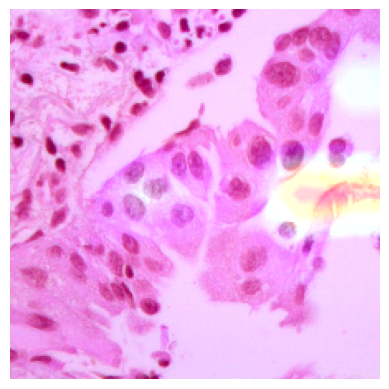

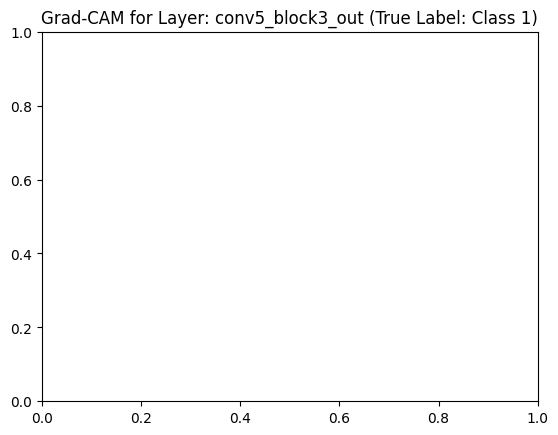

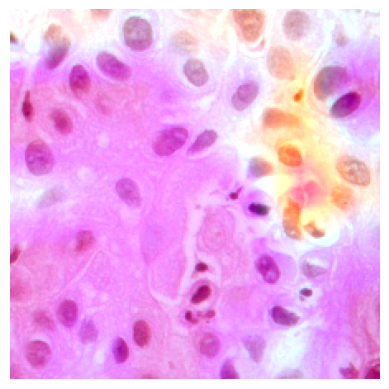

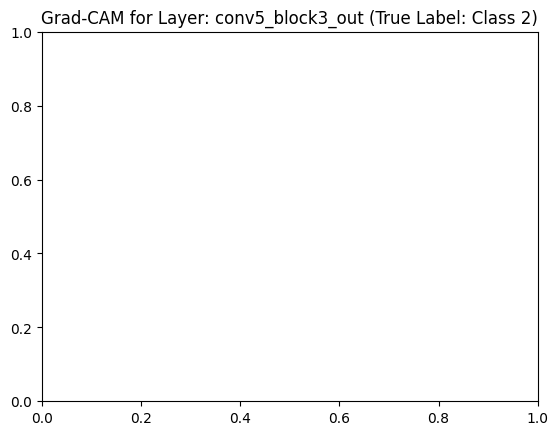

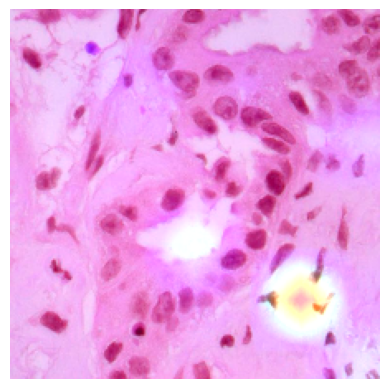

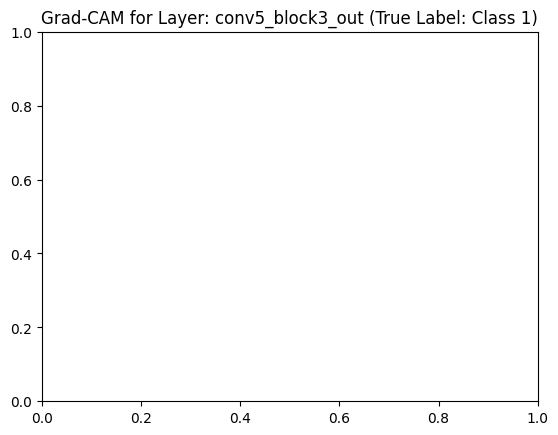

ResNet50 with RandAugment for Lung Cancer Classification's Training Complete using Full Training Data on GPU.


In [49]:
import tensorflow as tf

# Ensure GPU is used for training
with tf.device('/GPU:0'):  # Specify to use the GPU
    # Build ResNet50
    resnet50_randaugment = build_resnet50(input_shape=(224, 224, 3), num_classes=3)

    # Train and evaluate the ResNet50 using the full dataset
    history_resnet50_randaugment, acc_resnet50_randaugment, precision_resnet50_randaugment, recall_resnet50_randaugment, f1_resnet50_randaugment = training_evaluation_pipeline(
        resnet50_randaugment,
        X_train_augmented, y_train_one_hot,  # Use the full preprocessed training dataset
        X_test, y_test_one_hot,              # Use the full preprocessed testing dataset
        batch_size=8,  # Reduced batch size
        epochs=15,
        model_name="ResNet50 with RandAugment",
        save_path="resnet50_randaugment.h5",
        class_labels=["Class 0", "Class 1", "Class 2"]
    )

# Log results
log_message("ResNet50 with RandAugment for Lung Cancer Classification's Training Complete using Full Training Data on GPU.")


## EfficientNetB0 after RandAugment

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_5[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,378,278 (16.70 MB)

 Trainable params: 4,336,255 (16.54 MB)

 Non-trainable params: 42,023 (164.16 KB)

Starting training for EfficientNetB0 with RandAugment...
Epoch 1/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 103s 55ms/step - accuracy: 0.7740 - loss: 0.5656 - val_accuracy: 0.8407 - val_loss: 0.7030
Epoch 2/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.8637 - loss: 0.3397 - val_accuracy: 0.9760 - val_loss: 0.0823
Epoch 3/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9104 - loss: 0.2442 - val_accuracy: 0.9327 - val_loss: 0.1674
Epoch 4/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9104 - loss: 0.2359 - val_accuracy: 0.9727 - val_loss: 0.0655
Epoch 5/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9340 - loss: 0.1739 - val_accuracy: 0.9667 - val_loss: 0.1066
Epoch 6/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9255 - loss: 0.1841 - val_accuracy: 0.9847 - val_loss: 0.0548
Epoch 7/15
750/750 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step - accuracy: 0.9381 - loss: 0.1614 - val_accuracy: 0.9727 - val_loss: 0.0975
Epoch 8/15
750/750 ━━━━━━━━━━━━━

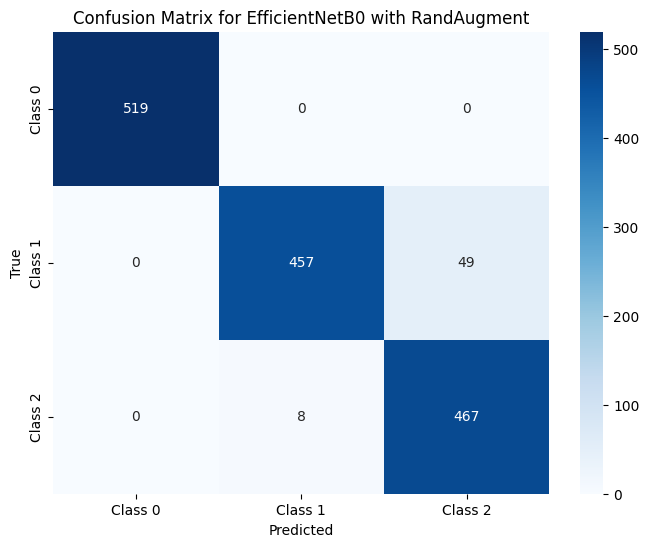

EfficientNetB0 with RandAugment saved at efficientnetb0_randaugment.h5.


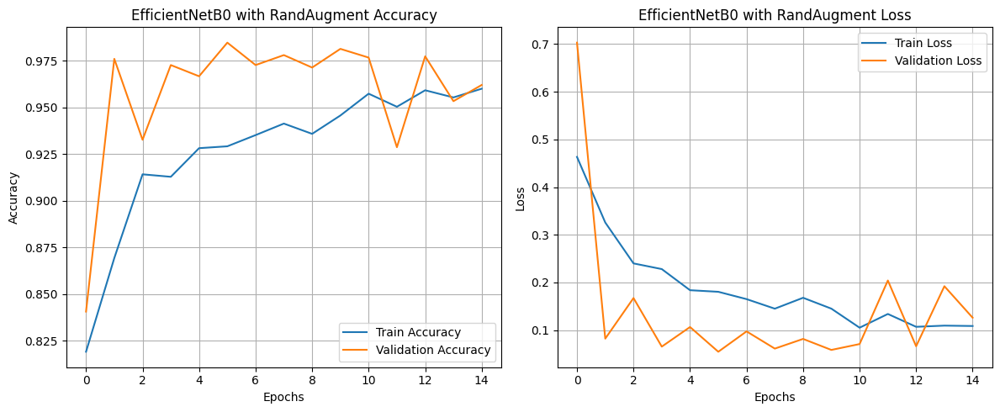

Applying Grad-CAM on 3 random test images for EfficientNetB0 with RandAugment...


/tmp/ipykernel_23/2278269453.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap("jet")


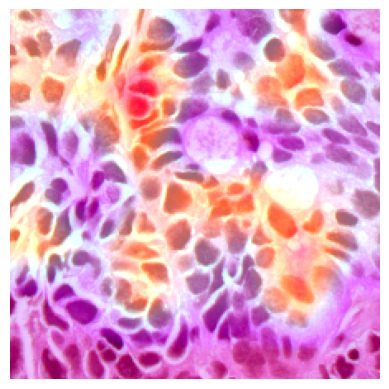

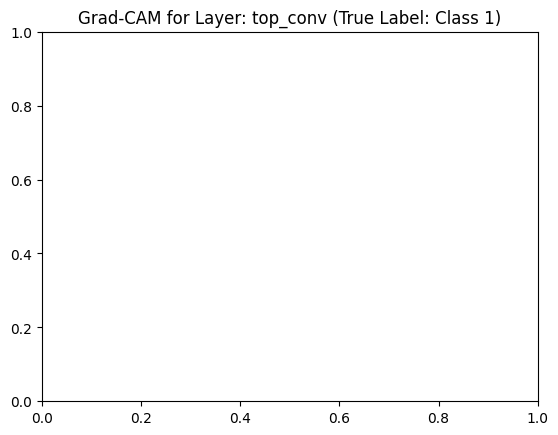

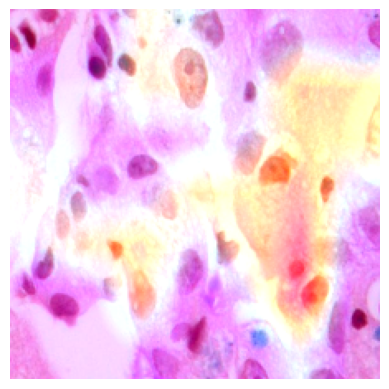

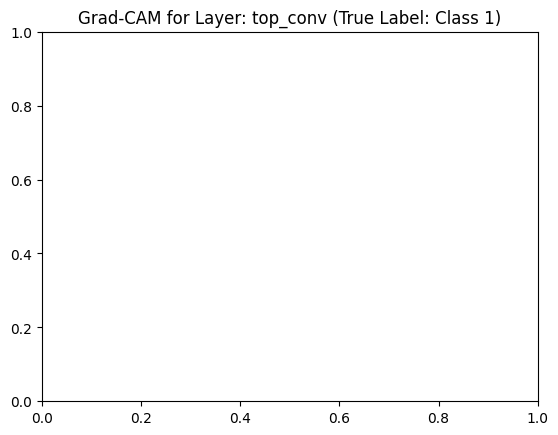

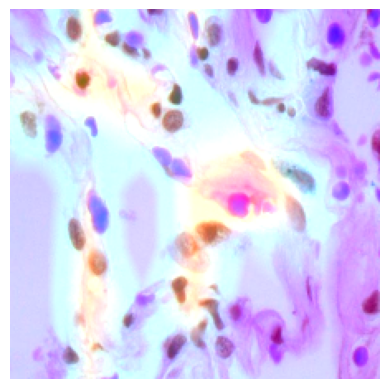

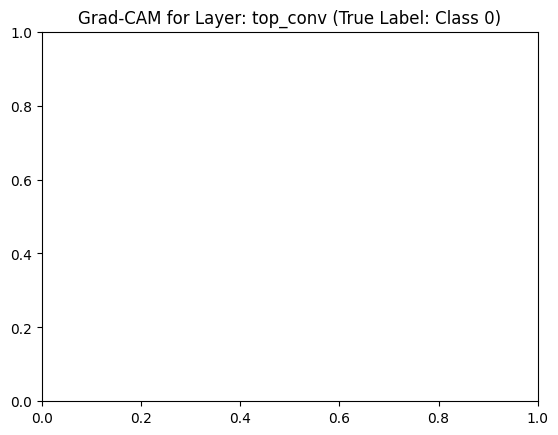

EfficientNetB0 with RandAugment for Lung Cancer Classification's Training Complete using Full Training Data on GPU.


In [50]:
# Ensure GPU is used for training
with tf.device('/GPU:0'):  # Specify to use the GPU
    # Build EfficientNetB0
    efficientnetb0_randaugment = build_efficientnet(input_shape=(224, 224, 3), num_classes=3)

    # Train and evaluate the EfficientNetB0 using the full dataset
    history_efficientnetb0_randaugment, acc_efficientnetb0_randaugment, precision_efficientnetb0_randaugment, recall_efficientnetb0_randaugment, f1_efficientnetb0_randaugment = training_evaluation_pipeline(
        efficientnetb0_randaugment,
        X_train_augmented, y_train_one_hot,  # Use the full preprocessed training dataset
        X_test, y_test_one_hot,              # Use the full preprocessed testing dataset
        batch_size=8,
        epochs=15,
        model_name="EfficientNetB0 with RandAugment",
        save_path="efficientnetb0_randaugment.h5",
        class_labels=["Class 0", "Class 1", "Class 2"]
    )

# Log results
log_message("EfficientNetB0 with RandAugment for Lung Cancer Classification's Training Complete using Full Training Data on GPU.")


# Summary of Models after RandAugment

In [51]:
# Compile metrics into a dictionary
results = {
    "Model": ["Custom CNN", "ResNet50", "EfficientNetB0"],
    "Accuracy (%)": [acc_cnn_randaugment * 100, acc_resnet50_randaugment * 100, acc_efficientnetb0_randaugment * 100],
    "Precision": [precision_cnn_randaugment, precision_resnet50_randaugment, precision_efficientnetb0_randaugment],
    "Recall": [recall_cnn_randaugment, recall_resnet50_randaugment, recall_efficientnetb0_randaugment],
    "F1-Score": [f1_cnn_randaugment, f1_resnet50_randaugment, f1_efficientnetb0_randaugment]
}

# Create DataFrame
results_df = pd.DataFrame(results)

# Save results to CSV
results_df.to_csv("Augmented_model_results.csv", index=False)

# Log results to a file
log_message("Model Training Results:\n" + results_df.to_string(index=False))

# Display the DataFrame
print("Model Training Results:")
print(results_df)

Model Training Results:
         Model  Accuracy (%)  Precision   Recall  F1-Score
    Custom CNN     52.733333   0.473797 0.527333  0.443985
      ResNet50     84.200000   0.866469 0.842000  0.839352
EfficientNetB0     96.200000   0.964125 0.962000  0.961984
Model Training Results:
            Model  Accuracy (%)  Precision    Recall  F1-Score
0      Custom CNN     52.733333   0.473797  0.527333  0.443985
1        ResNet50     84.200000   0.866469  0.842000  0.839352
2  EfficientNetB0     96.200000   0.964125  0.962000  0.961984


# Loading Model on Test Set Images

In [52]:
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Paths to saved models
model_paths = [
    "custom_cnn.h5",
    "custom_cnn_randaugment.h5",
    "efficientnetb0.h5",
    "efficientnetb0_randaugment.h5",
    "resnet50.h5",
    "resnet50_randaugment.h5"
]

In [53]:
# Load models
models = {}
with tf.device('/GPU:0'):  # Ensure loading happens on GPU
    for path in model_paths:
        model_name = path.split(".")[0]  # Extract model name from the filename
        models[model_name] = tf.keras.models.load_model(path)
        print(f"Loaded model: {model_name}")

Loaded model: custom_cnn
Loaded model: custom_cnn_randaugment
Loaded model: efficientnetb0
Loaded model: efficientnetb0_randaugment
Loaded model: resnet50
Loaded model: resnet50_randaugment


In [54]:
# Randomly select 5 test samples
num_samples = 5
random_indices = random.sample(range(len(X_test)), num_samples)
selected_images = X_test[random_indices]  # Test images
selected_labels = y_test_one_hot[random_indices]  # Corresponding true labels

# Class labels
class_labels = ['benign', 'mal_aca','mal_scc']
#class_labels = ["Benign", "mal_aca", "mal_scc"]  # Replace with your actual class labels

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━

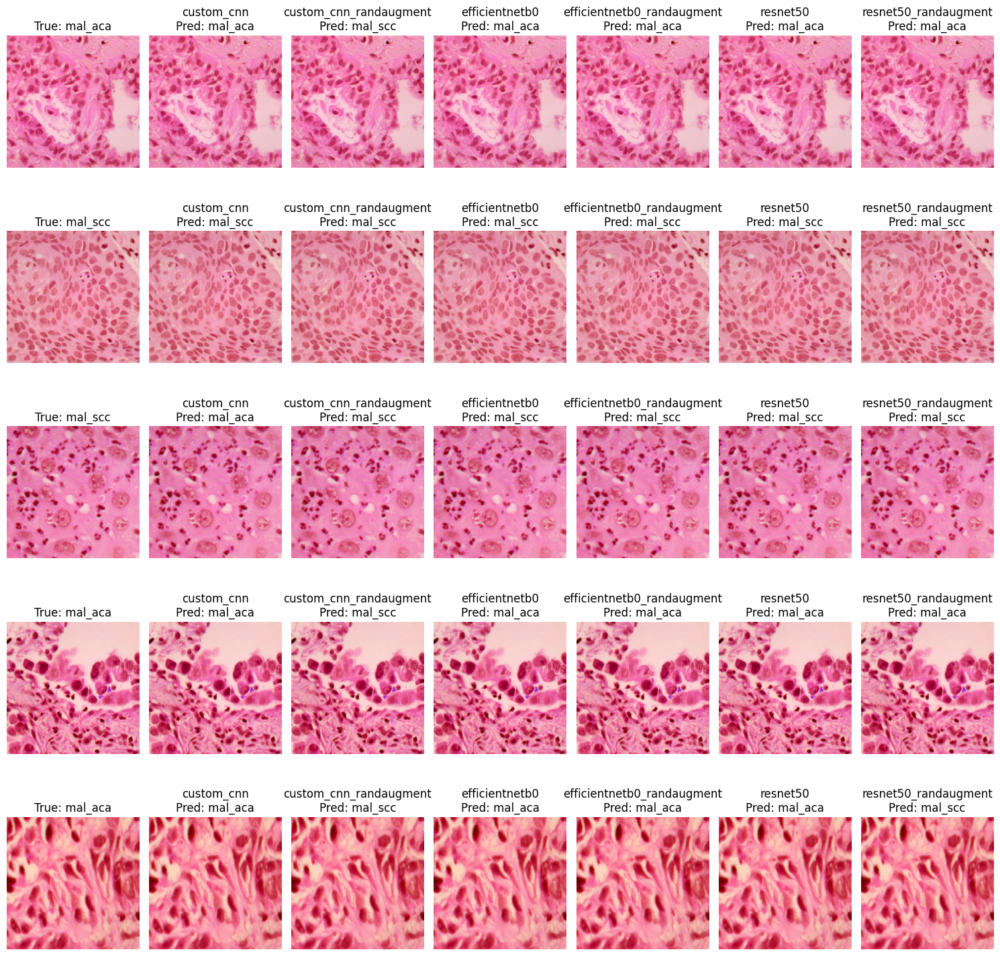

In [55]:
# Plot original vs classified results
fig, axes = plt.subplots(num_samples, len(models) + 1, figsize=(15, num_samples * 3))

with tf.device('/GPU:0'):  # Ensure predictions are executed on GPU
    for i, (img, true_label) in enumerate(zip(selected_images, selected_labels)):
        # Show original image
        axes[i, 0].imshow((img * 255).astype(np.uint8))  # Denormalize if necessary
        axes[i, 0].set_title(f"True: {class_labels[np.argmax(true_label)]}")
        axes[i, 0].axis("off")

        # Classify using each model
        for j, (model_name, model) in enumerate(models.items()):
            # Predict
            img_batch = np.expand_dims(img, axis=0)  # Add batch dimension
            predicted_label = np.argmax(model.predict(img_batch), axis=1)[0]

            # Display the result
            axes[i, j + 1].imshow((img * 255).astype(np.uint8))
            axes[i, j + 1].set_title(f"{model_name}\nPred: {class_labels[predicted_label]}")
            axes[i, j + 1].axis("off")

plt.tight_layout()
plt.show()